In [2]:
#All the imports I need tis one
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RepeatedKFold, GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score
import warnings
from sklearn.exceptions import UndefinedMetricWarning
import warnings
warnings.filterwarnings('ignore')

In [3]:
#standardizing the data
# Read the CSV file

df = pd.read_csv('training_data/rice_feature_data.csv',index_col=0)
print(df.sample(10))

df2=df.copy()
# Separate the target variable
target = df['class_int']

# Drop the columns that are not needed for training
df.drop(['class', 'class_int'], axis=1, inplace=True)

# Standardize the remaining features
scaler = StandardScaler()
standardized_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

print(standardized_df.sample(10))

         mean_b        var_b    skew_b    kurt_b    entr_b      mean_g  \
157  214.218598  5521.262062 -2.499799  4.364899  4.714489  199.674717   
39   193.089635  4657.657674 -2.216014  3.643863  6.072272  193.017244   
275  195.036631  5383.172997 -2.232471  3.136259  5.131754  186.138688   
66   211.943037  4512.394400 -2.643060  5.584546  5.669833  206.302889   
70   207.934149  5052.714584 -2.480146  4.451898  5.224585  203.757187   
235  198.097844  4447.291422 -2.610708  4.893484  4.407330  193.374585   
1    198.979599  3817.027883 -2.848875  6.331098  5.023563  186.775913   
127  225.415440  5101.558110 -2.816782  6.008496  4.287905  200.519472   
56   213.822451  4212.130677 -2.840290  6.557856  5.521500  208.883585   
52   199.613560  3876.910602 -2.757519  6.060710  5.490310  198.111454   

           var_g    skew_g    kurt_g    entr_g  ...    kurt_r    entr_r  \
157  4885.177024 -2.411689  4.119690  5.311454  ... -0.514121  5.250025   
39   4687.534102 -2.186739  3.55538

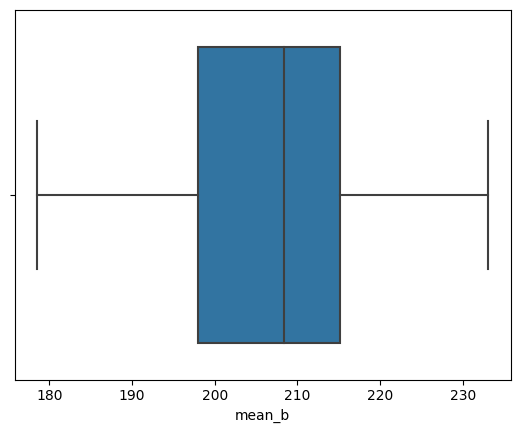

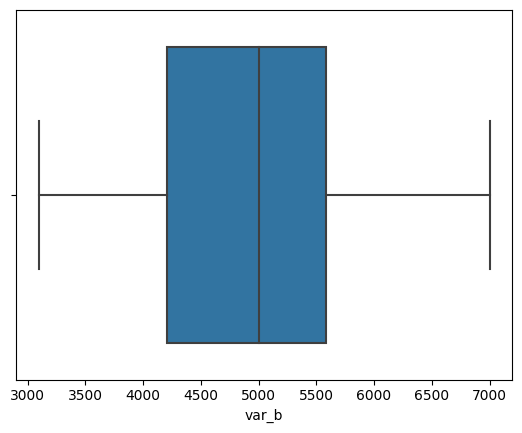

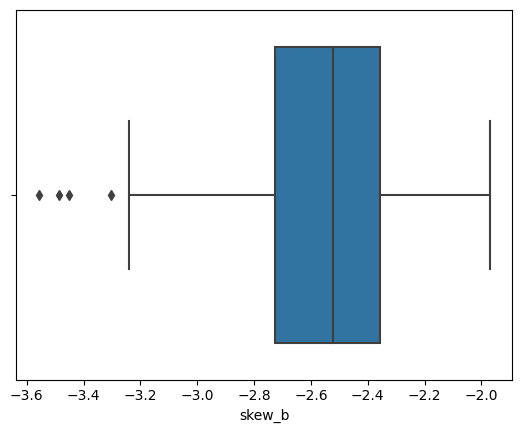

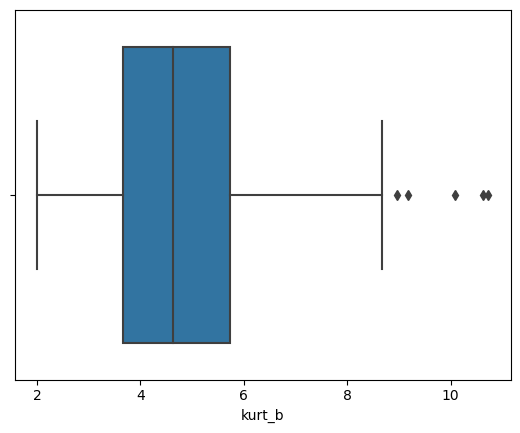

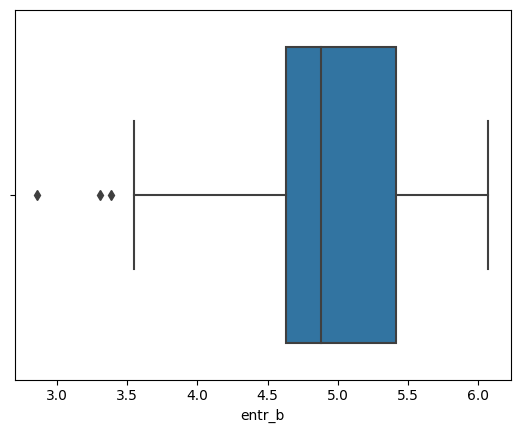

...

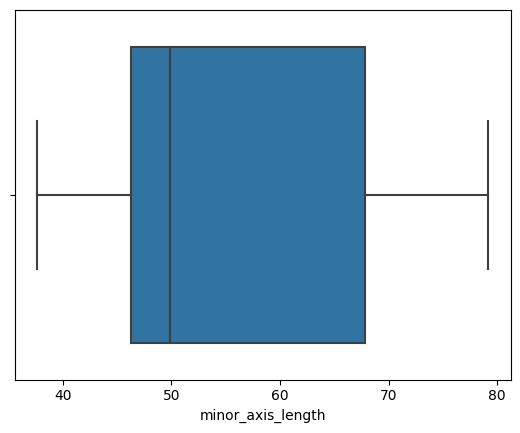

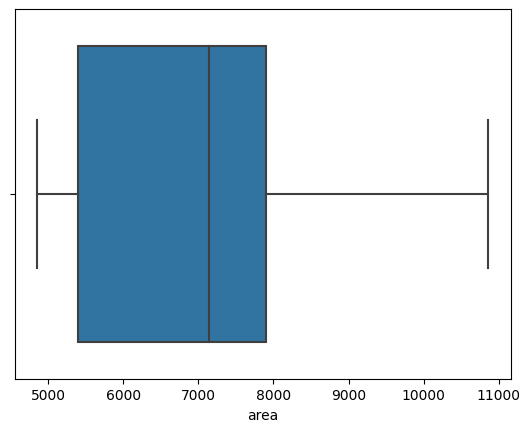

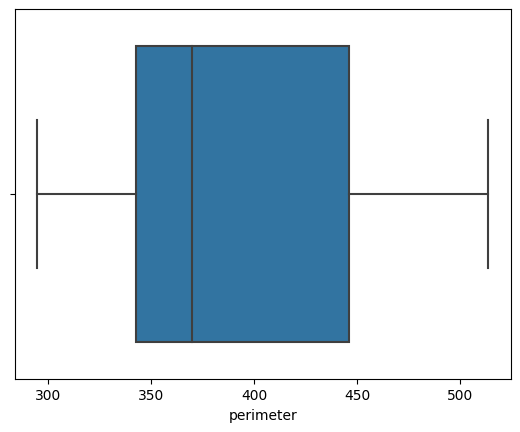

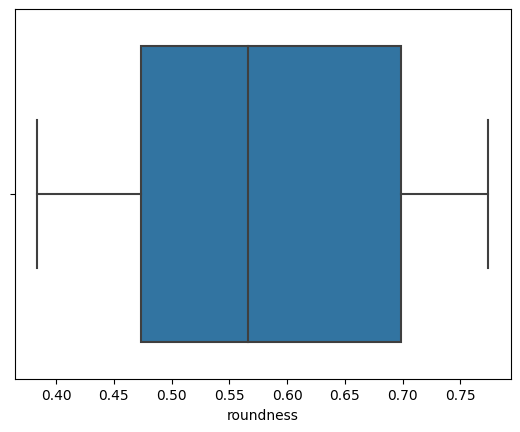

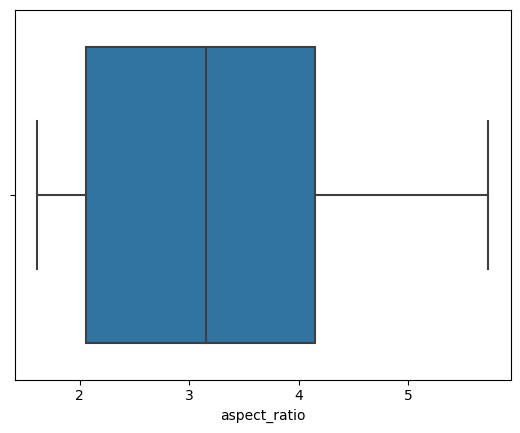

In [4]:
#creating a boxplot for each feature
for column in standardized_df.columns:
    sns.boxplot(x=df[column])
    plt.show()

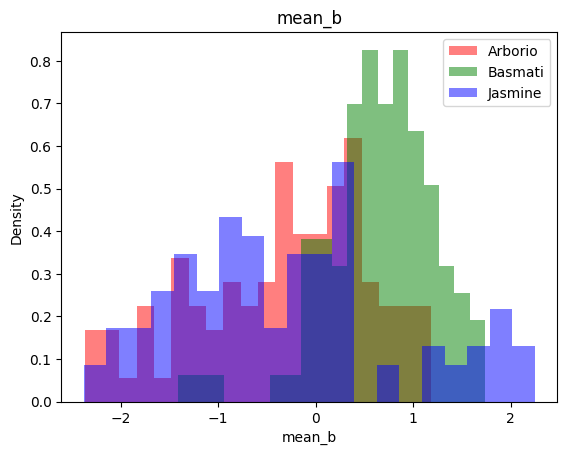

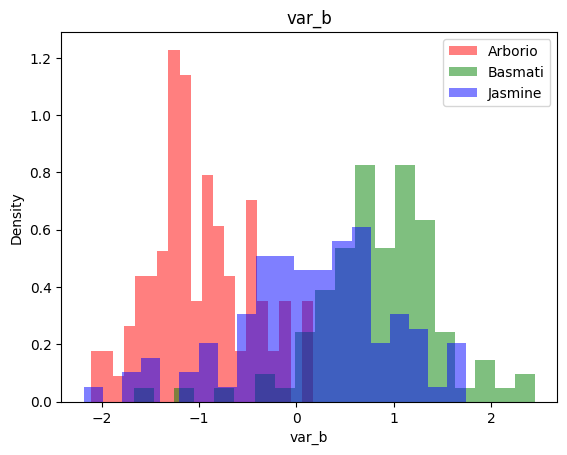

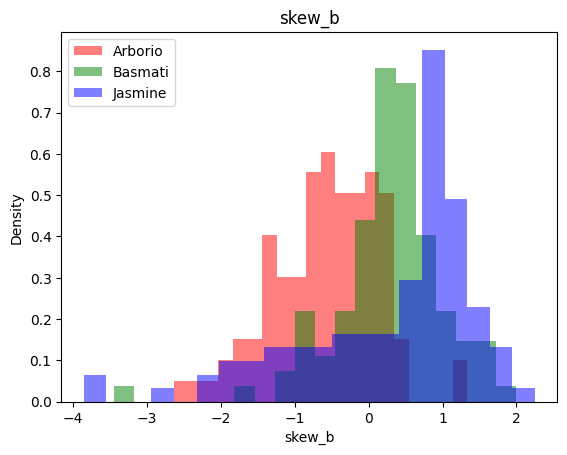

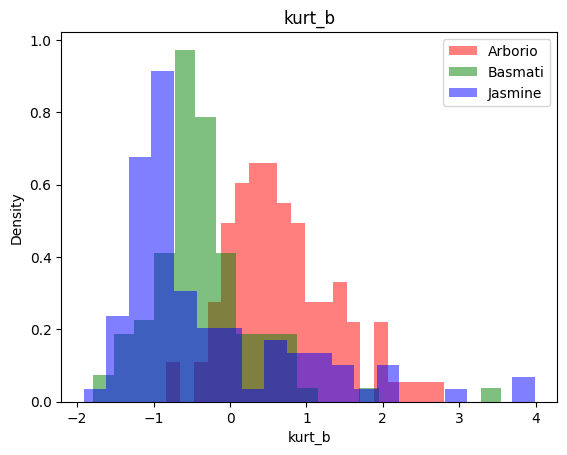

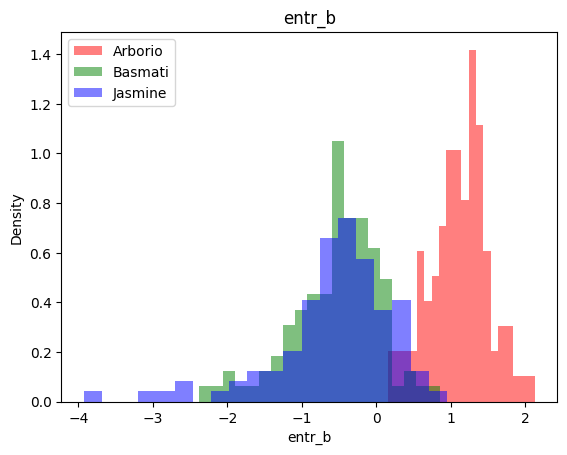

...

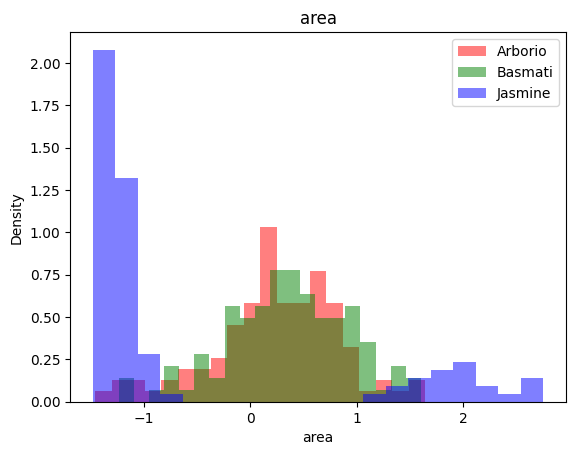

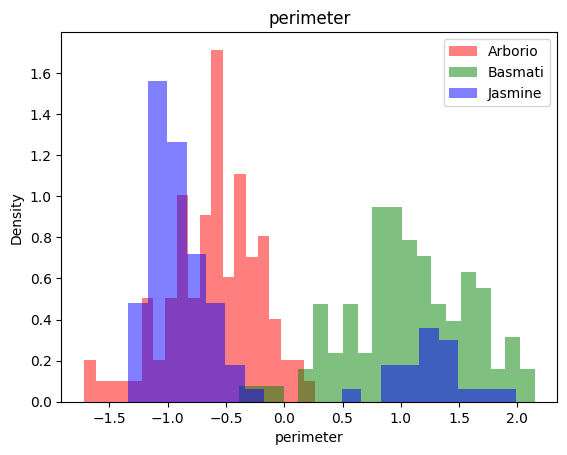

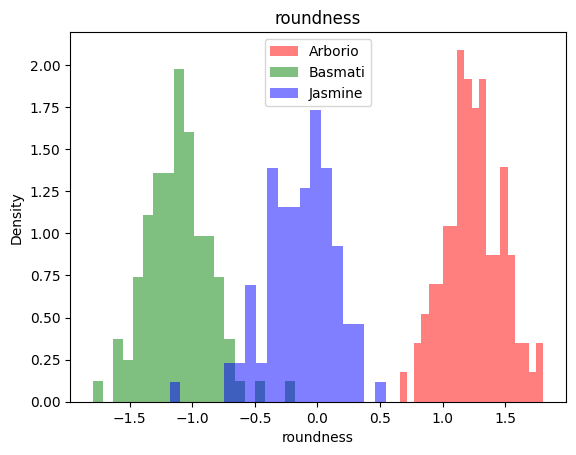

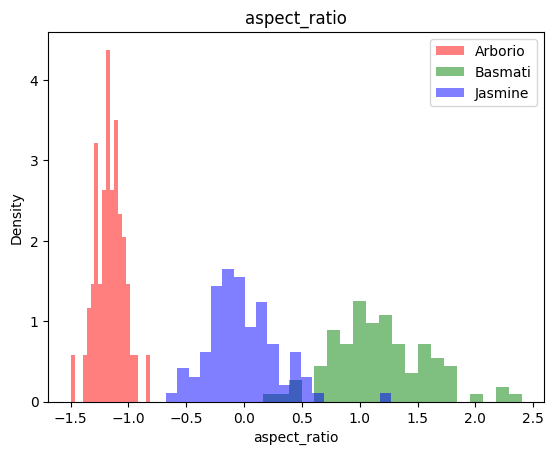

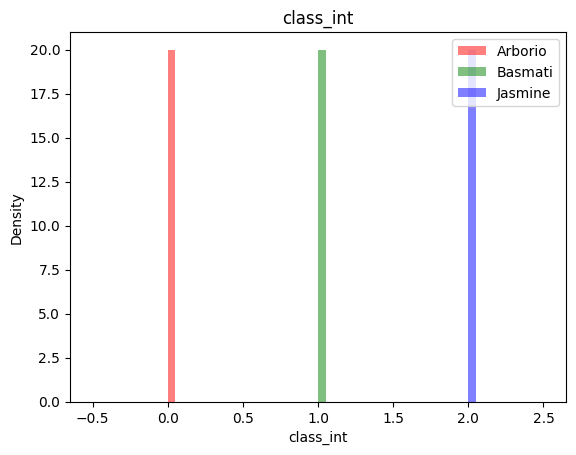

In [5]:
#creating histograms for each feature
# Define the colors for each class
colors = ['red', 'green', 'blue']
standardized_df['class_int'] = df2['class_int']
# Loop through each feature
for feature in standardized_df: 
    plt.figure()
    plt.title(feature)
    
    # Loop through each class
    for i in range(3):
        # Filter the data for this class
        class_data = standardized_df[standardized_df['class_int'] == i]
        # Create a histogram for this class and feature
        plt.hist(class_data[feature], bins=20, alpha=0.5, color=colors[i], density=True)
    
    # Add a legend and labels
    plt.legend(['Arborio', 'Basmati', 'Jasmine'])
    plt.xlabel(feature)
    plt.ylabel('Density')

plt.show()

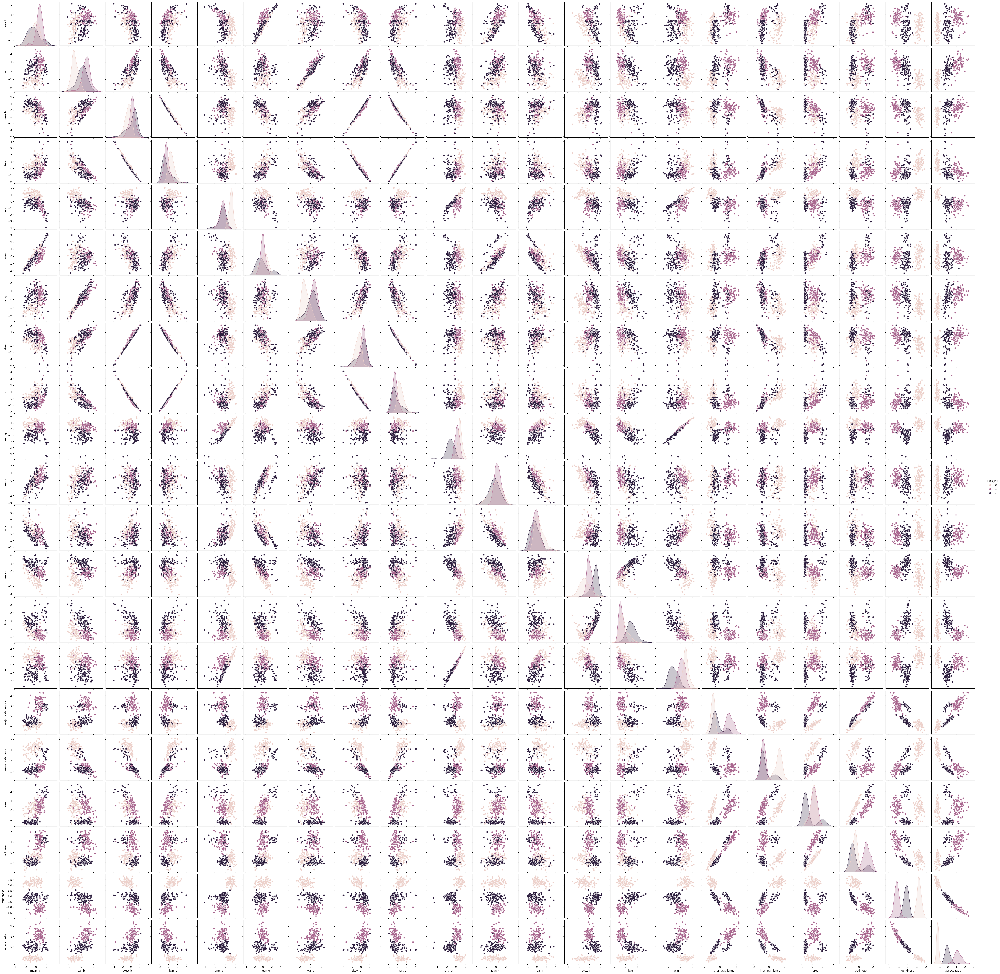

In [6]:
#pairplots

sns.pairplot(standardized_df, hue="class_int")
plt.show()


Looking at the boxplots and histograms, we can see that some features seem to be more differentiating between classes than others. For example, the "roundness" and "aspect_ratio" features show clear separation between the three classes in the histograms.

In the pairplot, we can also see some correlation between feature. We can also see that there is a clear separation between the classes in the scatterplots for some features, which again confirms what we saw in the histograms and boxplots.

Overall, it seems like some features, such as "roundness" and "aspect_ratio", could be very useful in predicting the correct class. However, we would need to perform some feature selection and modeling to determine the most useful features and to build an accurate classification model.

In [7]:
# Fit PCA with two components and delete the 'class_int' column 
standardized_df.drop('class_int',axis=1,inplace=True)
pca = PCA(n_components=2)

pca.fit(standardized_df)

# Transform the standardized data using the fitted PCA
transformed_data = pca.transform(standardized_df)

# Create a new DataFrame with the transformed data and the target variable
pca_df = pd.DataFrame(data=transformed_data, columns=['PC1', 'PC2'])
pca_df['class_int'] = target

print(pca_df)

          PC1       PC2  class_int
0    2.441548  0.810256          0
1    2.995940 -2.327363          0
2    3.408100 -0.348894          0
3    3.022592  1.456542          0
4    3.348404 -1.676929          0
..        ...       ...        ...
295 -0.896540 -1.359820          2
296 -4.206077 -0.266418          2
297  0.739544 -1.026321          2
298 -1.770170  6.111634          2
299 -0.908232 -3.762491          2

[300 rows x 3 columns]


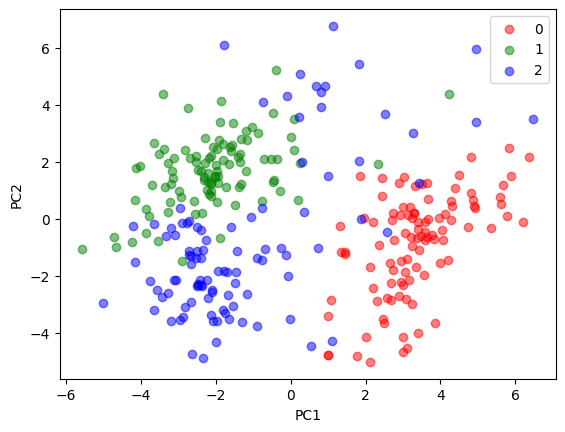

In [8]:
# Set up a color map for the species
color_map = {0: 'red', 1: 'green', 2: 'blue'}

# Create the scatter plot
fig, ax = plt.subplots()
for species in range(3):
    ax.scatter(pca_df.loc[pca_df['class_int'] == species, 'PC1'],
               pca_df.loc[pca_df['class_int'] == species, 'PC2'],
               color=color_map[species],
               alpha=0.5,
               label=species)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.legend()
plt.show()

Yes you can see cluseters here you could definitely pick up 2 maybe three if you were to really look for it. It does expalin that Arborio(red or 0) is more distinguished than the other two which at least in part or closer to each other.

In [9]:
#source:https://towardsdatascience.com/how-to-select-the-best-number-of-principal-components-for-the-dataset-287e64b14c6d
# Fit PCA with all components
pca2 = PCA(n_components=0.99)


pca2.fit(standardized_df)

print("Number of components needed to cover 99% of the variance:", pca2.n_components_)


Number of components needed to cover 99% of the variance: 9


Best k for k-NN: 3


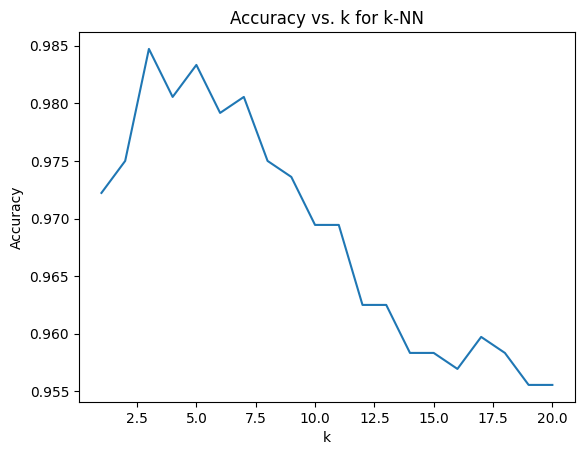

KNeighborsClassifier(n_neighbors=3)

In [10]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(standardized_df, target, test_size=0.2, random_state=42)

# k-Nearest Neighbors classifier
knn = KNeighborsClassifier()
param_grid = {'n_neighbors': range(1, 21)}
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(knn, param_grid, cv=cv, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_k = grid_search.best_params_['n_neighbors']
print('Best k for k-NN:', best_k)

# Plot accuracy versus k
k_range = range(1, 21)
accuracy = grid_search.cv_results_['mean_test_score']
plt.plot(k_range, accuracy)
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. k for k-NN')
plt.show()

# Train the final k-NN model using the best k
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train, y_train)





Best max_depth for random forest: 2
Best max_features for random forest: sqrt


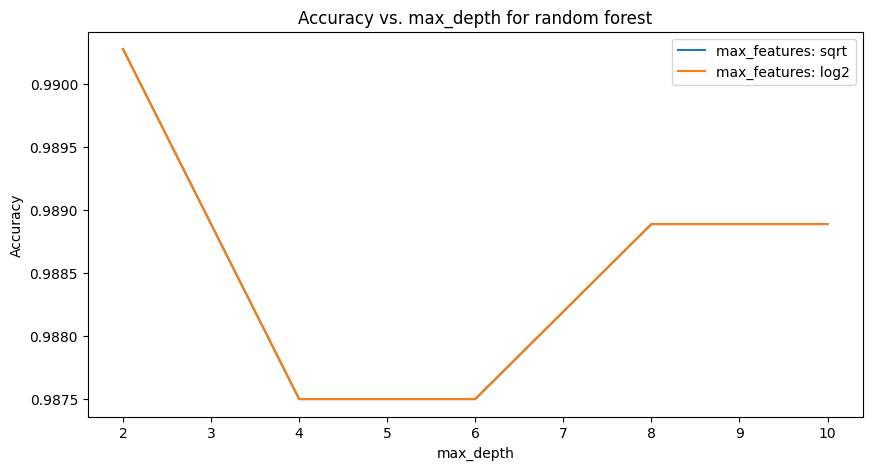

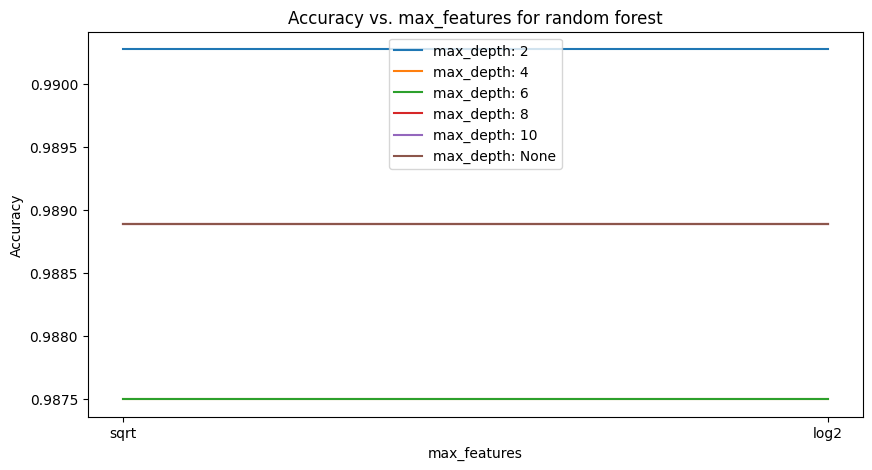

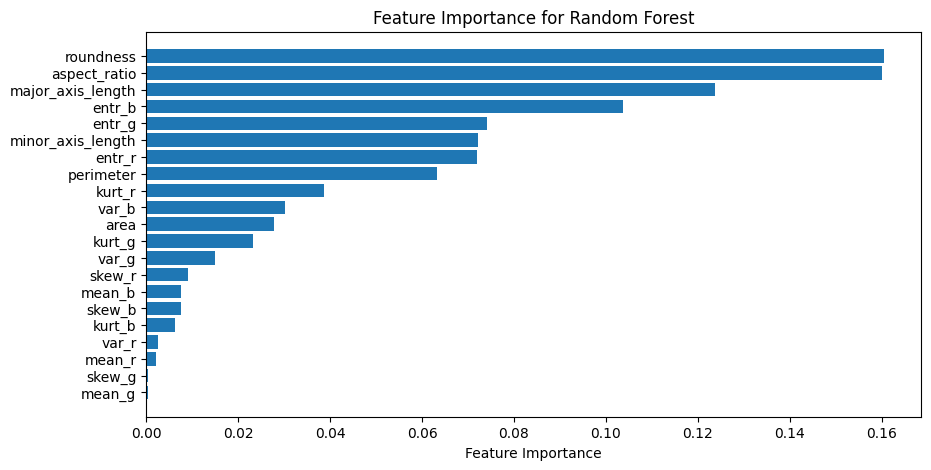

In [11]:
# Random forest classifier
rf = RandomForestClassifier(max_features='sqrt', random_state=42)
param_grid = {'max_depth': [2, 4, 6, 8, 10, None], 'max_features': ['sqrt', 'log2']}
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(rf, param_grid, cv=cv, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_max_depth = grid_search.best_params_['max_depth']
best_max_features = grid_search.best_params_['max_features']
print('Best max_depth for random forest:', best_max_depth)
print('Best max_features for random forest:', best_max_features)

# Plot accuracy versus max_depth and max_features
max_depth_range = [2, 4, 6, 8, 10, None]
max_features_range = ['sqrt', 'log2']
accuracy = grid_search.cv_results_['mean_test_score']

plt.figure(figsize=(10,5))

# Plot accuracy vs max_depth for each max_features value
for max_features in max_features_range:
    accuracies = accuracy[max_features_range.index(max_features)::len(max_features_range)]
    plt.plot(max_depth_range, accuracies, label='max_features: {}'.format(max_features))

plt.legend()
plt.xlabel('max_depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. max_depth for random forest')
plt.show()

plt.figure(figsize=(10,5))

# Plot accuracy vs max_features for each max_depth value
for max_depth in max_depth_range:
    accuracies = accuracy[max_depth_range.index(max_depth)*len(max_features_range):(max_depth_range.index(max_depth)+1)*len(max_features_range)]
    plt.plot(max_features_range, accuracies, label='max_depth: {}'.format(max_depth))

plt.legend()
plt.xlabel('max_features')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. max_features for random forest')
plt.show()

# Train the final random forest model using the best hyperparameters
rf = RandomForestClassifier(max_depth=best_max_depth, max_features=best_max_features, random_state=42)
rf.fit(X_train, y_train)

# Plot feature importance
feature_importance = rf.feature_importances_
feature_names = standardized_df.columns
sorted_idx = feature_importance.argsort()

plt.figure(figsize=(10,5))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Random Forest')
plt.show()

Here we can see that roundess and aspect ratio are the most important features to see when we think what features would be useful in predicting the correct class which correlates perfectly on what I said about my histograms.

Best hidden_layer_sizes for MLP: (50,)
Best activation for MLP: relu
Best solver for MLP: adam
Best validation_fraction for MLP: 0.5


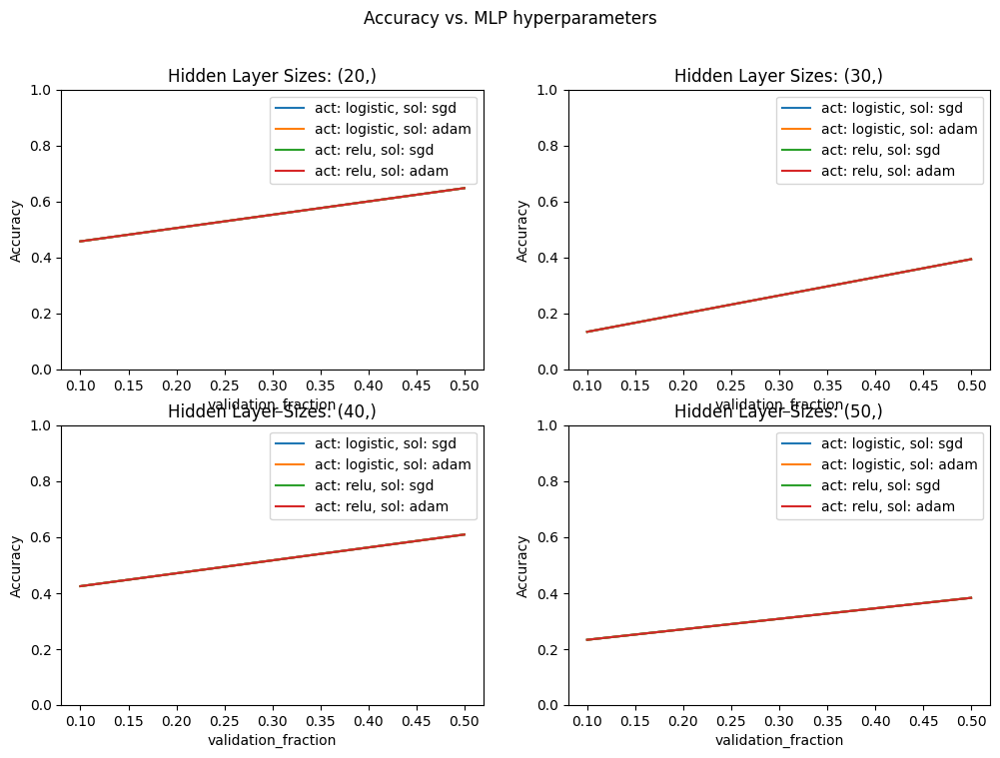

In [12]:
hidden_layer_sizes_range = [(20,), (30,), (40,), (50,),]
activation_range = ['logistic', 'relu']
solver_range = ['sgd', 'adam']
validation_fraction_range = [0.1, 0.5]

# Perform grid search
param_grid = {
    'hidden_layer_sizes': hidden_layer_sizes_range,
    'activation': activation_range,
    'solver': solver_range,
    'validation_fraction': validation_fraction_range
}

mlp = MLPClassifier(early_stopping=True, random_state=42)
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(mlp, param_grid, cv=cv, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Report the best hyperparameters
best_hidden_layer_sizes = grid_search.best_params_['hidden_layer_sizes']
best_activation = grid_search.best_params_['activation']
best_solver = grid_search.best_params_['solver']
best_validation_fraction = grid_search.best_params_['validation_fraction']
print('Best hidden_layer_sizes for MLP:', best_hidden_layer_sizes)
print('Best activation for MLP:', best_activation)
print('Best solver for MLP:', best_solver)
print('Best validation_fraction for MLP:', best_validation_fraction)

# Plot accuracy versus hyperparameters
accuracy = grid_search.cv_results_['mean_test_score']
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Accuracy vs. MLP hyperparameters')

i = 0
for row in range(2):
    for col in range(2):
        axs[row, col].set_ylim([0, 1])
        axs[row, col].set_title('Hidden Layer Sizes: {}'.format(hidden_layer_sizes_range[i]))
        for activation in activation_range:
            for solver in solver_range:
                axs[row, col].plot(validation_fraction_range[:2], accuracy[(i*4):((i+1)*4)][:2], label='act: {}, sol: {}'.format(activation, solver))
                axs[row, col].set_xlabel('validation_fraction')
                axs[row, col].set_ylabel('Accuracy')
                axs[row, col].legend()
        i += 1

plt.show()
